## Metodologia di testing

Le strutture dati analizzate sono:

- _Adapative_ HH-tree
- _Strict_ HH-tree
- Tabella di hash
- Lista

I dataset considerati sono

- MAGIC Gamma Telescope Dataset (`magic04`)
- Cloud DataSet (`cloud`)
- Shelter Animal Outcomes (`shelterDogs`)

I parametri `m` e `b` hanno valori da 1 a 50, per ogni loro combinazione sono state prelevate 10 permutazioni dei primi 50 elementi di ognuno dei 3 dataset e sono state inserite, una per volta, in tutte le strutture dati. Da ogni struttura dati è stata prelevata la metrica `avg_insertion` che misura il numero medio di accessi necessari per completare un inserimento `avg_size` che misura il numero medio di slot utilizzati dalla struttura dati per conservare i dati e `avg_access` che misura il numero medio di accessi necessari per effettuare una ricerca. Per le strutture ad albero sono state inoltre prelevate:

- `avg_depth`: profondità media dell'albero
- `avg_usage`: percentuale di riempimento delle foglie rispetto al massimo
- `std_depth`: deviazione standard della profondità dell'albero
- `std_usage`: deviazione standard del riempimento delle foglie rispetto al massimo

Ci interessano il tempo e lo spazio utilizzati da ogni struttura dati. Per il tempo possiamo considerare il numero di accessi necessari per completare un inserimento e quello per effettuare una ricerca (con ogni numero di feature). Per lo spazio dobbiamo fare considerazioni ad hoc per ogni struttura dati, questi dati sono contenuti nella metrica `avg_size`:

- HH-tree: il numero di nodi e foglie rispetto al numero di elementi
- Tabella di hash: la taglia della Tabella
- Lista: la taglia della lista

È stato inoltre calcolato il tempo di ricerca in base a quante feature sono utilizzate, intuitivamente questo diminuisce all'aumentare della percentuale di feature utilizzate e i dati mostrano proprio questo. In particolare per ogni `m`, `b` e `feature_amount` c'è il tempo medio di ricerca, su 50 ricerche.


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

min_m = min_b = 1
max_m = max_b = 50

color = "#24292E"

def scatter(ax, x, y, z, label):
    ax.scatter(x, y, z, c=z)
    ax.set_xlabel("m", color="white")
    ax.set_xbound(min_m, max_m)
    ax.set_ylabel("b", color="white")
    ax.set_ybound(min_b, max_b)
    ax.set_zlabel(label, color="white")
    ax.set_zticks([ round(v, 2) for v in np.linspace(min(z), max(z), 5) ])
    for t in ax.zaxis.get_major_ticks(): t.label.set_color("white")

def graphs(*args, **kwargs):
    fig = plt.figure(figsize=(20, 20), facecolor=color)

    for index, (z, label) in enumerate(args):
        ax = fig.add_subplot(2, len(args), index + 1, projection='3d', facecolor=color)
        
        plt.xticks([ int(v) for v in np.linspace(min_m, max_m, 10)], color="white")
        plt.yticks([ int(v) for v in np.linspace(min_b, max_b, 10)], color="white")

        if kwargs.get("keep_outliers", False):
            scatter(ax, x, y, z, label)
        else:
            upper = np.percentile(z, q=95)
            lower = np.percentile(z, q=10)
    
            mask = [lower <= v <= upper for v in z]
            scatter(ax, x[mask], y[mask], z[mask], label)

    if "title" in kwargs:
        plt.title(kwargs["title"], color="white")

    plt.show()

In [3]:
datasets = {
    "magic": "magic04.out",
    "cloud": "cloud.out",
    "shelterDogs": "shelterdogs.out"
}

tree = pd.read_csv("../data/tree/" + datasets["magic"])
hashgroup = pd.read_csv("../data/hashgroup/" + datasets["magic"])
linear = pd.read_csv("../data/linear/" + datasets["shelterDogs"])

x, y = tree["m"], tree["b"]

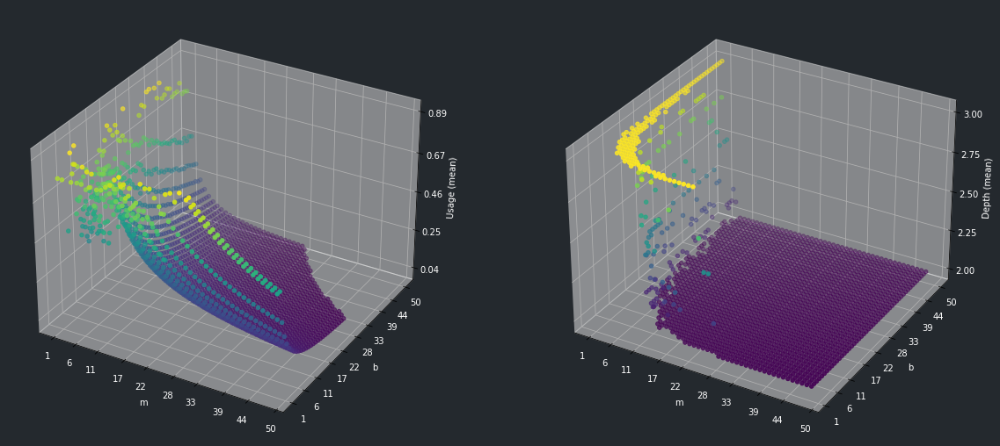

In [4]:
graphs((tree["avg_usage"], "Usage (mean)"), (tree["avg_depth"], "Depth (mean)"))

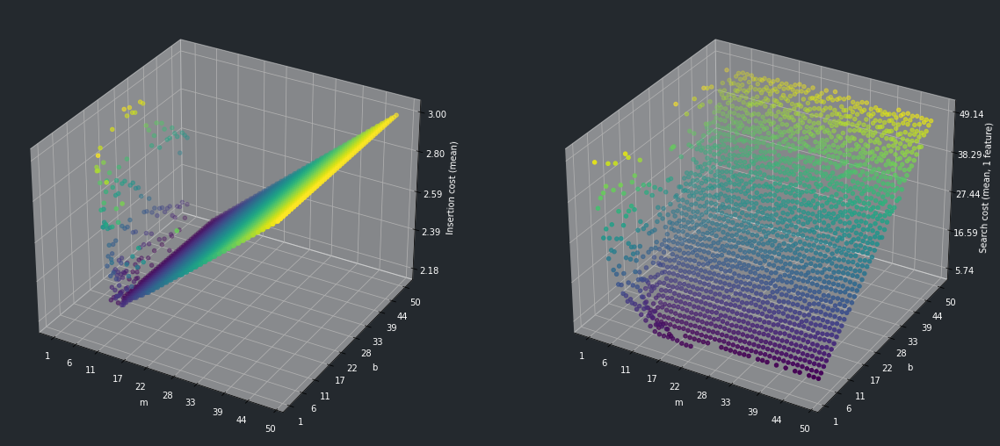

In [5]:
graphs((tree["avg_insertion"], "Insertion cost (mean)"), (tree["avg_access"], "Search cost (mean, 1 feature)"))

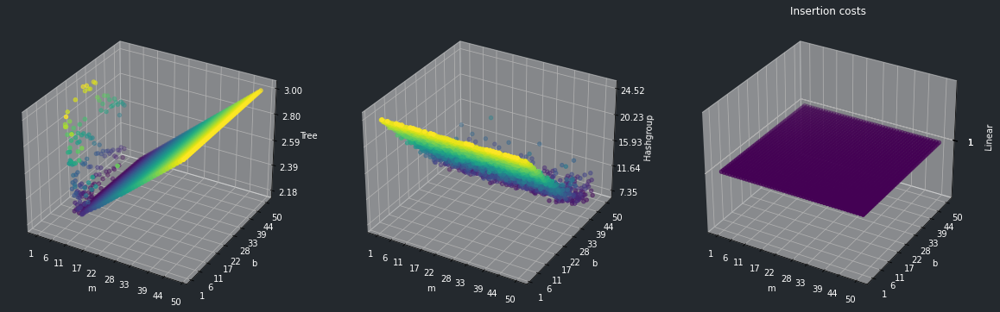

In [6]:
graphs((tree["avg_insertion"], "Tree"), (hashgroup["avg_insertion"], "Hashgroup"), (linear["avg_insertion"], "Linear"), title="Insertion costs")

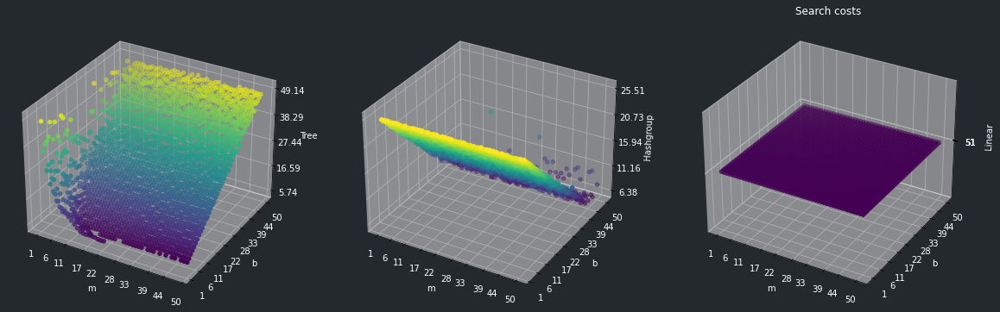

In [7]:
graphs((tree["avg_access"], "Tree"), (hashgroup["avg_access"], "Hashgroup"), (linear["avg_access"], "Linear"), title="Search costs")

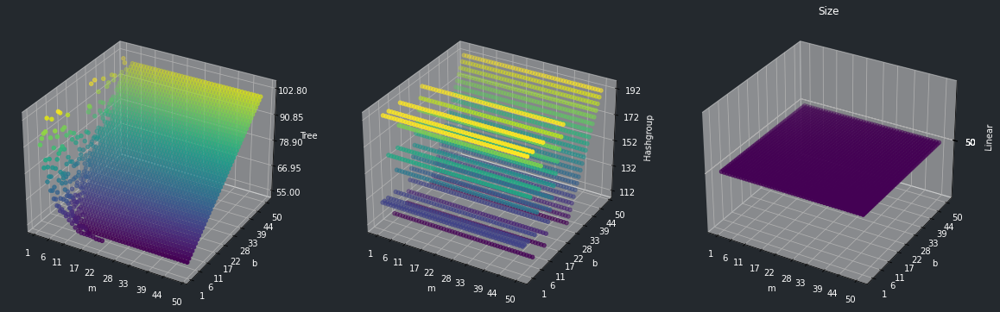

In [8]:
graphs((tree["avg_size"], "Tree"), (hashgroup["avg_size"], "Hashgroup"), (linear["avg_size"], "Linear"), title="Size")

In [134]:
multi = pd.read_csv("../data/tree/multifeature_search.out") #.iloc[::80, :]
feature_amount = multi["feature_amount"].unique()
values = [(multi[multi["feature_amount"] == i]["avg_access"], i) for i in multi["feature_amount"].unique() ]

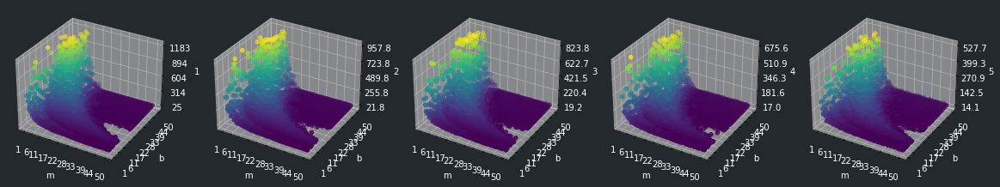

In [139]:
graphs(*values[:5])

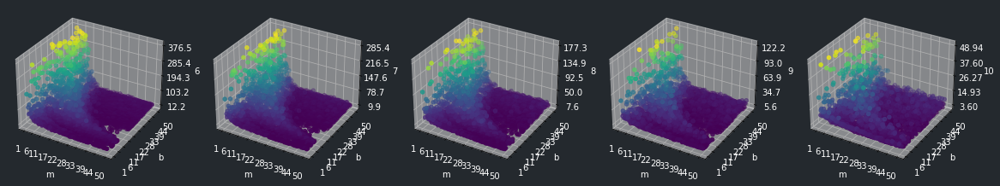

In [136]:
graphs(*values[5:])

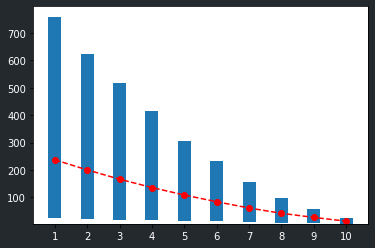

In [149]:
bardata = [v for v, i in values]
plt.figure(facecolor=color)
plt.bar(feature_amount, [np.percentile(v, q=90) for v in bardata], bottom=[np.percentile(v, q=10) for v in bardata], width=0.4)
plt.plot(feature_amount, [v.mean() for v in bardata], "go--", color="red")
plt.xticks(feature_amount, (str(i) for i in feature_amount), color="white")
plt.yticks(color="white")
plt.show()